
- 1. Convolutional Neural network
The core operation in a CNN layer is convolution. It involves sliding a small filter (also known as a kernel) across the input data to perform element-wise multiplication and summation.
Each filter captures specific features such as edges, textures, or patterns from the input image. The size of the filter (e.g., 3x3, 5x5) determines the receptive field or area of the input image that the filter considers at a time.





### 2. Vision Transformer
<br>
1) Patch embeddings

- Similar to text, the input image is divided into 16x16 individual tokens. We call each patch linearly projected into lower division in vector space.

2) Positional embeddings

- Helps to understand the relative positions of patches in the input.

3) Transformer Encoder

- Consists of multi-head self-attention mechanism to capture global dependencies of patches


<div>
<img src="03_images/05_vistr_01.png" width="500">
</div>



### 2. ResNet
<br>
1) Residual Block
- $H(x) = F(x) + x$
<div>
<img src="03_images/05_resnet_01_2.png" width="400" height="300">
</div>

- Identity path is a short cut to output block without any transformation.
- Residual path involves transformation(CV, norm, activation) on the input to learn residual mappings.


2) Skip Connection
<br>

- It can skip one or more layers to help the model to learn residual mapping.


3) Stacked layers

4) Global Average Pooling(GAP)
- Resnet architectures typically utilises Global average Pooling as the final layer before the fully connected layer .GAP reduces spatial dimensions to a single value per feature map providing a compact representation of the entire feature map.

<div>
<img src="03_images/05_resnet_01.png" width="1000" height="300">
</div>

<div>
<img src="03_images/05_resnet_02.png" width="400" height="300">
</div>

<div>
<img src="03_images/05_resnet_03.png" width="400" height="300">
</div>

<div>
<img src="03_images/05_resnet_04.png" width="400" height="300">
</div>

<div>
<img src="03_images/05_resnet_05.png" width="400" height="300">
</div>

3. Image Padding (ReflectionPadding)
- contents' edge. Reflection padding helps preserve image features and reduce boundary artifacts that can occur during image processing operations, such as convolution, pooling, or resizing. It ensures that information near the edges of the image is considered during processing, leading to more accurate and visually pleasing results, particularly in tasks like edge detection or image segmentation.

4. Image Siamese vs. Text Siamese

- Nothing but image uses conv layer to encode each image when NLP uses encoders like lstm, rnn, or transformer.

5. Image detection (Object Detection)

- Object detection, on the other hand, focuses on identifying and localizing specific objects or instances within an image. It not only detects the presence of objects but also provides bounding boxes or masks outlining the object's location and extent.
- 5 outputs. 4 is for the box and 1 is for the object
<div>
<img src="03_images/05_iseg_01.png" width="400" height="300">
</div>
<div>
<img src="03_images/05_iseg_02.gif" width="600" height="300">
</div>

- Segmentation is to classify the object by edges.
<div>
<img src="03_images/05_iseg_03.png" width="400" height="300">
</div>



In [1]:
from torchvision.io import read_image
import matplotlib.pyplot as plt

In [2]:
image = read_image("data/images/Abyssinian_4.jpg")

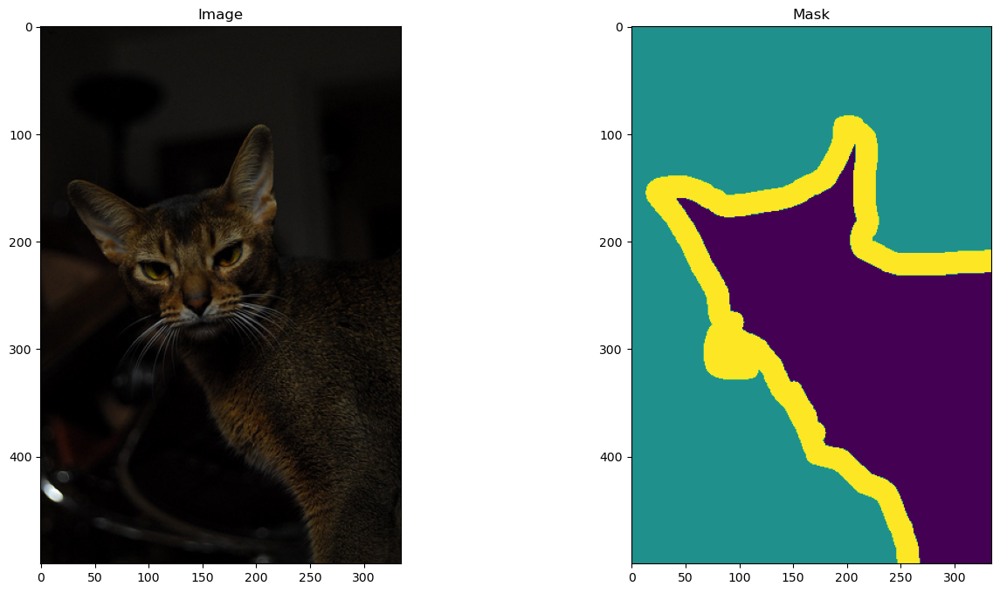

In [3]:
mask = read_image("data/trimaps/Abyssinian_4.png")

plt.figure(figsize=(16, 8))
plt.subplot(121)
plt.title("Image")
plt.imshow(image.permute(1, 2, 0))
plt.subplot(122)
plt.title("Mask")
plt.imshow(mask.permute(1, 2, 0))

In [4]:
import pandas as pd
list_df = pd.read_csv('data/list.txt',sep='\t',header=None)
list_df = list_df.iloc[6:]
list_df = list_df[0].str.split(' ',expand=True)

list_df.columns=['name','class_id','species','breed_id']
list_df.reset_index(drop=True,inplace=True)
list_df.head()

,name,class_id,species,breed_id
0,Abyssinian_100,1,1,1
1,Abyssinian_101,1,1,1
2,Abyssinian_102,1,1,1
3,Abyssinian_103,1,1,1
4,Abyssinian_104,1,1,1


In [5]:
list_df.groupby(['species'])['breed_id'].count()

species
1    2371
2    4978
Name: breed_id, dtype: int64

In [6]:
import numpy as np
import random
import itertools
list_dog_breed = ['1','2','3','4']
#random.sample(list(list_df.loc[list_df.species=='1','breed_id'].unique()),4)
list_cat_breed = ['1','2','3','4']
#random.sample(list(list_df.loc[list_df.species=='2','breed_id'].unique()),4)

list_dog_sample_index = list(itertools.chain(*[random.sample(list(list_df.loc[
                   (list_df.species=='1')
                   &
                   ((list_df.breed_id==i))
                   ,:].index),70)
for i in list_dog_breed]))

list_cat_sample_index = list(itertools.chain(*[random.sample(list(list_df.loc[
                   (list_df.species=='2')
                   &
                   ((list_df.breed_id==i))
                   ,:].index),70)
for i in list_cat_breed]))
list_df_new = list_df.iloc[list_dog_sample_index + list_cat_sample_index,:].reset_index(drop=True)
list_df_new.groupby(['species','breed_id']).count()

name  class_id
species breed_id                
1       1           70        70
        2           70        70
        3           70        70
        4           70        70
2       1           70        70
        2           70        70
        3           70        70
        4           70        70

In [7]:
from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(list_df_new,test_size=0.2857,stratify=list_df_new[['species','breed_id']])


### Remove background

In [8]:
import torch
import torch.nn as nn


from torchvision.models import resnet
nonlinearity = nn.ReLU

class DecoderBlock(nn.Module):
    def __init__(self, in_channels, n_filters):
        super().__init__()

        # B, C, H, W -> B, C/4, H, W
        self.conv1 = nn.Conv2d(in_channels, in_channels // 4, 1)
        self.norm1 = nn.BatchNorm2d(in_channels // 4)
        self.relu1 = nonlinearity(inplace=True)

        # B, C/4, H, W -> B, C/4, H, W
        self.deconv2 = nn.ConvTranspose2d(in_channels // 4, in_channels // 4, 3,
                                          stride=2, padding=1, output_padding=1)
        self.norm2 = nn.BatchNorm2d(in_channels // 4)
        self.relu2 = nonlinearity(inplace=True)

        # B, C/4, H, W -> B, C, H, W
        self.conv3 = nn.Conv2d(in_channels // 4, n_filters, 1)
        self.norm3 = nn.BatchNorm2d(n_filters)
        self.relu3 = nonlinearity(inplace=True)

    def forward(self, x):
        x = self.conv1(x)
        x = self.norm1(x)
        x = self.relu1(x)
        x = self.deconv2(x)
        x = self.norm2(x)
        x = self.relu2(x)
        x = self.conv3(x)
        x = self.norm3(x)
        x = self.relu3(x)
        return x


class LinkNet(nn.Module):
    def __init__(self, num_classes, num_channels=3, encoder='resnet34'):
        super().__init__()
        assert encoder in ['resnet18', 'resnet34']

        filters = [64, 128, 256, 512]
        
        res = resnet.resnet34(pretrained=True)
        
        self.firstconv = res.conv1
        self.firstbn = res.bn1
        self.firstrelu = res.relu
        self.firstmaxpool = res.maxpool
        self.encoder1 = res.layer1
        self.encoder2 = res.layer2
        self.encoder3 = res.layer3
        self.encoder4 = res.layer4

        # Decoder
        self.decoder4 = DecoderBlock(filters[3], filters[2])
        self.decoder3 = DecoderBlock(filters[2], filters[1])
        self.decoder2 = DecoderBlock(filters[1], filters[0])
        self.decoder1 = DecoderBlock(filters[0], filters[0])

        # Final Classifier
        self.finaldeconv1 = nn.ConvTranspose2d(filters[0], 32, 3,
                                               stride=2)
        self.finalrelu1 = nonlinearity(inplace=True)
        self.finalconv2 = nn.Conv2d(32, 32, 3)
        self.finalrelu2 = nonlinearity(inplace=True)
        self.finalconv3 = nn.Conv2d(32, num_classes, 2, padding=1)

    def forward(self, x):
        # Encoder
        x = self.firstconv(x)
        x = self.firstbn(x)
        x = self.firstrelu(x)
        x = self.firstmaxpool(x)
        e1 = self.encoder1(x)
        e2 = self.encoder2(e1)
        e3 = self.encoder3(e2)
        e4 = self.encoder4(e3)

        # Decoder with Skip Connections
        d4 = self.decoder4(e4) + e3
        d3 = self.decoder3(d4) + e2
        d2 = self.decoder2(d3) + e1
        d1 = self.decoder1(d2)

        # Final Classification
        x = self.finaldeconv1(d1)
        x = self.finalrelu1(x)
        x = self.finalconv2(x)
        x = self.finalrelu2(x)
        x = self.finalconv3(x)
        return x

In [9]:
from torchvision import transforms

train_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])


target_transform = transforms.Compose([
    transforms.Resize((256, 256)),     
    transforms.Lambda(lambda x: (x-1).squeeze().type(torch.LongTensor)) 
                                      ])

In [10]:
import os
import pandas as pd
from torchvision import transforms, io

import torch
from torch.utils.data import Dataset, DataLoader
class segDataset(Dataset):
    def __init__(self, dataframe, image_dir, mask_dir, itransform=None,mtransform=None):
        self.dataframe = dataframe
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.itransform = itransform
        self.mtransform = mtransform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_name = self.dataframe.iloc[idx, 0]  # Assuming image filenames in the first column
        
        img_path = os.path.join(self.image_dir, (img_name+'.jpg'))
        mask_path = os.path.join(self.mask_dir, (img_name+'.png'))

        # Read image and mask using torchvision.io.read_image
        img = io.read_image(img_path)[:3,:,:]
        mask = io.read_image(mask_path)[:3,:,:]

        if self.itransform:
            img = self.itransform(img)
            mask = self.mtransform(mask)

        return img, mask

In [11]:
io.read_image('data/trimaps/Abyssinian_100.png').shape

io.read_image('data/images/Abyssinian_100.jpg').shape

torch.Size([3, 500, 394])

In [12]:
train_dataset = segDataset(train_df,'data/images','data/trimaps',itransform=train_transform,mtransform=target_transform)
test_dataset = segDataset(test_df,'data/images','data/trimaps',itransform=train_transform,mtransform=target_transform)
# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=12, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=3, shuffle=False)


In [13]:
class MetricMonitor:
    def __init__(self, float_precision=3):
        self.float_precision = float_precision
        self.reset()

    def reset(self):
        self.metrics = defaultdict(lambda: {"val": 0, "count": 0, "avg": 0})

    def update(self, metric_name, val):
        metric = self.metrics[metric_name]

        metric["val"] += val
        metric["count"] += 1
        metric["avg"] = metric["val"] / metric["count"]

    def __str__(self):
        return " | ".join(
            [
                "{metric_name}: {avg:.{float_precision}f}".format(
                    metric_name=metric_name, avg=metric["avg"], float_precision=self.float_precision
                )
                for (metric_name, metric) in self.metrics.items()])


def create_model(params):
    model = LinkNet(3)
    model = model.to(params["device"])
    return model


from torchmetrics.functional import dice

def fit(model, train_dataset, val_dataset, params):
    torch.cuda.empty_cache()
    criterion = nn.CrossEntropyLoss().to(params['device'])
    optimizer = torch.optim.Adam(model.parameters(), lr=params["lr"])
 
    history = pd.DataFrame(columns=['end_loss', 'end_correct', 'end_dice', 'end_val_loss', 'end_val_correct', 'end_val_dice'])

    for epoch in range(1, params["epochs"] + 1):
        
        loss = 0
        correct = 0
        dice_score = 0
        train_loss = 0
        train_correct = 0
        train_dice_score = 0
        val_loss = 0
        val_correct = 0
        val_dice_score = 0
        
        #Train
        metric_monitor = MetricMonitor()
        stream = tqdm(train_loader)
        for i, (images, targets) in enumerate(stream, start=1):
            images = images.to(params["device"], non_blocking=True)
            targets = targets.to(params["device"], non_blocking=True)
            outputs = model(images)
            loss = criterion(outputs, targets)
            metric_monitor.update("Loss", loss.item())

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            stream.set_description("Epoch: {epoch}. Train.  {metric_monitor}".format(epoch=epoch, metric_monitor=metric_monitor))
                
        train_loss = loss.item()
        _, pred = torch.max(outputs, 1)
        correct = torch.mean((pred == targets).type(torch.float64))
        dice_score = dice(pred, targets, average='macro', num_classes=3)
        print("-> Epoch: {:.1f}. Train.  Dice Score: {:.3f}  Accuracy: {:.3f}".format(epoch, dice_score, correct.cpu().numpy()))
        
        
        with torch.no_grad():
            stream = tqdm(test_loader)
            for i, (images, targets) in enumerate(stream, start=1):
                images = images.to(params["device"], non_blocking=True)
                targets = targets.to(params["device"], non_blocking=True)
                outputs = model(images)
                loss = criterion(outputs, targets)
                metric_monitor.update("Loss", loss.item())
                stream.set_description("Epoch: {epoch}. Validation.  {metric_monitor}".format(epoch=epoch, metric_monitor=metric_monitor))
            val_loss = loss.item()
            _, pred = torch.max(outputs, 1)
            val_correct = torch.mean((pred == targets).type(torch.float32))
            val_dice_score = dice(pred, targets, average='macro', num_classes=3)
            print("-> Epoch: {:.1f}. Validation.  Dice Score: {:.3f}  Accuracy: {:.3f}".format(epoch, val_dice_score, val_correct.cpu().numpy()))


        history.loc[len(history.index)] = [train_loss, correct.cpu().numpy(),
                                           dice_score.cpu().numpy(), val_loss,
                                           val_correct.cpu().numpy(), val_dice_score.cpu().numpy()]
                                                                                    
    return history

###########

/Users/tchun/opt/anaconda3/envs/carparts/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/tchun/opt/anaconda3/envs/carparts/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Epoch: 1. Train.  Loss: 0.777: 100%|█████████████████████████████████████████████| 34/34 [01:36<00:00,  2.84s/it]


-> Epoch: 1.0. Train.  Dice Score: 0.244  Accuracy: 0.579


Epoch: 1. Validation.  Loss: 0.727: 100%|████████████████████████████████████████| 54/54 [00:14<00:00,  3.72it/s]


-> Epoch: 1.0. Validation.  Dice Score: 0.291  Accuracy: 0.776


Epoch: 2. Train.  Loss: 0.632: 100%|█████████████████████████████████████████████| 34/34 [01:36<00:00,  2.84s/it]


-> Epoch: 2.0. Train.  Dice Score: 0.561  Accuracy: 0.813


Epoch: 2. Validation.  Loss: 0.636: 100%|████████████████████████████████████████| 54/54 [00:13<00:00,  3.93it/s]


-> Epoch: 2.0. Validation.  Dice Score: 0.403  Accuracy: 0.639


Epoch: 3. Train.  Loss: 0.537: 100%|█████████████████████████████████████████████| 34/34 [01:35<00:00,  2.81s/it]


-> Epoch: 3.0. Train.  Dice Score: 0.552  Accuracy: 0.792


Epoch: 3. Validation.  Loss: 0.557: 100%|████████████████████████████████████████| 54/54 [00:13<00:00,  3.87it/s]


-> Epoch: 3.0. Validation.  Dice Score: 0.545  Accuracy: 0.846


Epoch: 4. Train.  Loss: 0.457: 100%|█████████████████████████████████████████████| 34/34 [01:36<00:00,  2.84s/it]


-> Epoch: 4.0. Train.  Dice Score: 0.583  Accuracy: 0.823


Epoch: 4. Validation.  Loss: 0.515: 100%|████████████████████████████████████████| 54/54 [00:13<00:00,  3.89it/s]


-> Epoch: 4.0. Validation.  Dice Score: 0.495  Accuracy: 0.781


Epoch: 5. Train.  Loss: 0.381: 100%|█████████████████████████████████████████████| 34/34 [01:35<00:00,  2.82s/it]


-> Epoch: 5.0. Train.  Dice Score: 0.564  Accuracy: 0.766


Epoch: 5. Validation.  Loss: 0.484: 100%|████████████████████████████████████████| 54/54 [00:13<00:00,  3.89it/s]


-> Epoch: 5.0. Validation.  Dice Score: 0.547  Accuracy: 0.821


Epoch: 6. Train.  Loss: 0.415: 100%|█████████████████████████████████████████████| 34/34 [01:35<00:00,  2.82s/it]


-> Epoch: 6.0. Train.  Dice Score: 0.711  Accuracy: 0.873


Epoch: 6. Validation.  Loss: 0.485: 100%|████████████████████████████████████████| 54/54 [00:13<00:00,  3.88it/s]


-> Epoch: 6.0. Validation.  Dice Score: 0.606  Accuracy: 0.804


Epoch: 7. Train.  Loss: 0.393: 100%|█████████████████████████████████████████████| 34/34 [01:35<00:00,  2.82s/it]


-> Epoch: 7.0. Train.  Dice Score: 0.731  Accuracy: 0.871


Epoch: 7. Validation.  Loss: 0.507: 100%|████████████████████████████████████████| 54/54 [00:13<00:00,  3.95it/s]


-> Epoch: 7.0. Validation.  Dice Score: 0.521  Accuracy: 0.729


Epoch: 8. Train.  Loss: 0.365: 100%|█████████████████████████████████████████████| 34/34 [01:36<00:00,  2.83s/it]


-> Epoch: 8.0. Train.  Dice Score: 0.731  Accuracy: 0.846


Epoch: 8. Validation.  Loss: 0.448: 100%|████████████████████████████████████████| 54/54 [00:13<00:00,  3.96it/s]


-> Epoch: 8.0. Validation.  Dice Score: 0.678  Accuracy: 0.790


Epoch: 9. Train.  Loss: 0.299: 100%|█████████████████████████████████████████████| 34/34 [01:36<00:00,  2.84s/it]


-> Epoch: 9.0. Train.  Dice Score: 0.729  Accuracy: 0.861


Epoch: 9. Validation.  Loss: 0.426: 100%|████████████████████████████████████████| 54/54 [00:15<00:00,  3.43it/s]


-> Epoch: 9.0. Validation.  Dice Score: 0.709  Accuracy: 0.834


Epoch: 10. Train.  Loss: 0.311: 100%|████████████████████████████████████████████| 34/34 [01:38<00:00,  2.90s/it]


-> Epoch: 10.0. Train.  Dice Score: 0.839  Accuracy: 0.905


Epoch: 10. Validation.  Loss: 0.408: 100%|███████████████████████████████████████| 54/54 [00:13<00:00,  3.94it/s]


-> Epoch: 10.0. Validation.  Dice Score: 0.635  Accuracy: 0.759


Epoch: 11. Train.  Loss: 0.273: 100%|████████████████████████████████████████████| 34/34 [01:36<00:00,  2.83s/it]


-> Epoch: 11.0. Train.  Dice Score: 0.787  Accuracy: 0.840


Epoch: 11. Validation.  Loss: 0.366: 100%|███████████████████████████████████████| 54/54 [00:14<00:00,  3.79it/s]


-> Epoch: 11.0. Validation.  Dice Score: 0.643  Accuracy: 0.746


Epoch: 12. Train.  Loss: 0.286: 100%|████████████████████████████████████████████| 34/34 [01:35<00:00,  2.82s/it]


-> Epoch: 12.0. Train.  Dice Score: 0.822  Accuracy: 0.892


Epoch: 12. Validation.  Loss: 0.414: 100%|███████████████████████████████████████| 54/54 [00:13<00:00,  3.91it/s]


-> Epoch: 12.0. Validation.  Dice Score: 0.657  Accuracy: 0.775


Epoch: 13. Train.  Loss: 0.264: 100%|████████████████████████████████████████████| 34/34 [01:36<00:00,  2.82s/it]


-> Epoch: 13.0. Train.  Dice Score: 0.793  Accuracy: 0.886


Epoch: 13. Validation.  Loss: 0.432: 100%|███████████████████████████████████████| 54/54 [00:13<00:00,  3.93it/s]


-> Epoch: 13.0. Validation.  Dice Score: 0.682  Accuracy: 0.807


Epoch: 14. Train.  Loss: 0.259: 100%|████████████████████████████████████████████| 34/34 [01:36<00:00,  2.83s/it]


-> Epoch: 14.0. Train.  Dice Score: 0.845  Accuracy: 0.901


Epoch: 14. Validation.  Loss: 0.384: 100%|███████████████████████████████████████| 54/54 [00:13<00:00,  3.86it/s]


-> Epoch: 14.0. Validation.  Dice Score: 0.668  Accuracy: 0.790


Epoch: 15. Train.  Loss: 0.198: 100%|████████████████████████████████████████████| 34/34 [01:35<00:00,  2.81s/it]


-> Epoch: 15.0. Train.  Dice Score: 0.880  Accuracy: 0.935


Epoch: 15. Validation.  Loss: 0.357: 100%|███████████████████████████████████████| 54/54 [00:13<00:00,  3.88it/s]


-> Epoch: 15.0. Validation.  Dice Score: 0.707  Accuracy: 0.833


Epoch: 16. Train.  Loss: 0.224: 100%|████████████████████████████████████████████| 34/34 [01:36<00:00,  2.83s/it]


-> Epoch: 16.0. Train.  Dice Score: 0.701  Accuracy: 0.757


Epoch: 16. Validation.  Loss: 0.347: 100%|███████████████████████████████████████| 54/54 [00:14<00:00,  3.82it/s]


-> Epoch: 16.0. Validation.  Dice Score: 0.723  Accuracy: 0.839


Epoch: 17. Train.  Loss: 0.261: 100%|████████████████████████████████████████████| 34/34 [01:35<00:00,  2.82s/it]


-> Epoch: 17.0. Train.  Dice Score: 0.814  Accuracy: 0.890


Epoch: 17. Validation.  Loss: 0.389: 100%|███████████████████████████████████████| 54/54 [00:13<00:00,  3.93it/s]


-> Epoch: 17.0. Validation.  Dice Score: 0.686  Accuracy: 0.788


Epoch: 18. Train.  Loss: 0.215: 100%|████████████████████████████████████████████| 34/34 [01:36<00:00,  2.83s/it]


-> Epoch: 18.0. Train.  Dice Score: 0.871  Accuracy: 0.925


Epoch: 18. Validation.  Loss: 0.361: 100%|███████████████████████████████████████| 54/54 [00:14<00:00,  3.74it/s]


-> Epoch: 18.0. Validation.  Dice Score: 0.679  Accuracy: 0.804


Epoch: 19. Train.  Loss: 0.177: 100%|████████████████████████████████████████████| 34/34 [01:36<00:00,  2.85s/it]


-> Epoch: 19.0. Train.  Dice Score: 0.864  Accuracy: 0.924


Epoch: 19. Validation.  Loss: 0.314: 100%|███████████████████████████████████████| 54/54 [00:14<00:00,  3.80it/s]


-> Epoch: 19.0. Validation.  Dice Score: 0.691  Accuracy: 0.805


Epoch: 20. Train.  Loss: 0.165: 100%|████████████████████████████████████████████| 34/34 [01:36<00:00,  2.83s/it]


-> Epoch: 20.0. Train.  Dice Score: 0.870  Accuracy: 0.917


Epoch: 20. Validation.  Loss: 0.311: 100%|███████████████████████████████████████| 54/54 [00:13<00:00,  3.88it/s]


-> Epoch: 20.0. Validation.  Dice Score: 0.680  Accuracy: 0.790


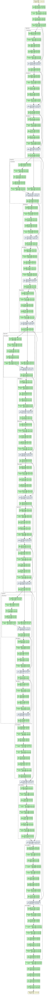

In [14]:
params = {
    "device": "cpu",
    "lr": 0.001,
    "batch_size": 32,
    "num_workers": 2,
    "epochs": 20,
}
import torchvision
from torchview import draw_graph
from collections import defaultdict
from tqdm import tqdm
model = create_model(params)
history = fit(model, train_loader, test_loader, params)
model_graph = draw_graph(model, input_size=(1,3,256,256), expand_nested=True)
model_graph.visual_graph

In [15]:
import xml.etree.ElementTree as ET
list_box = []
for i in train_df['name'].to_list():
    try:
        tree_df = ET.parse('data/xmls/'+i+'.xml').getroot()
        list_box.append([tree_df[5][4][0].text,tree_df[5][4][1].text,tree_df[5][4][2].text,tree_df[5][4][3].text])
    except:
        list_box.append([])
test_box = []
for i in test_df['name'].to_list():
    try:
        tree_df = ET.parse('data/xmls/'+i+'.xml').getroot()
        test_box.append([tree_df[5][4][0].text,tree_df[5][4][1].text,tree_df[5][4][2].text,tree_df[5][4][3].text])
    except:
        test_box.append([])

train_df['box'] = list_box
test_df['box'] = test_box


train_df_sia = train_df.loc[train_df['box'].apply(lambda x: len(x))!=0,:].reset_index(drop=True)
test_df_sia = test_df.loc[test_df['box'].apply(lambda x: len(x))!=0,:].reset_index(drop=True)
#x_min, y_min, x_max, y_max


train_dataset_sia = segDataset(train_df_sia,'data/images','data/trimaps',itransform=train_transform,mtransform=target_transform)
test_dataset_sia = segDataset(test_df_sia,'data/images','data/trimaps',itransform=train_transform,mtransform=target_transform)
# Create data loaders
train_loader_sia = DataLoader(train_dataset_sia, batch_size=12, shuffle=False)
train_loader_sia_shuffle = DataLoader(train_dataset_sia, batch_size=12, shuffle=False)
test_loader_sia = DataLoader(test_dataset_sia, batch_size=3, shuffle=False)



/var/folders/td/1zp1k2xj2m5dwylk8w2lttg80000gn/T/ipykernel_66191/3828582216.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['box'] = list_box
/var/folders/td/1zp1k2xj2m5dwylk8w2lttg80000gn/T/ipykernel_66191/3828582216.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['box'] = test_box


In [16]:
prediction_result = []
for i in test_loader_sia:
    prediction_result.append(model(i[0]))


prediction_result_train = []
for i in train_loader_sia:
    prediction_result_train.append(model(i[0]))

In [17]:
original_size = []
for i in test_df_sia['name']:
    original_size.append(list(io.read_image('data/trimaps/'+i+'.png').shape))

In [18]:
original_size_train = []
for i in train_df_sia['name']:
    original_size_train.append(list(io.read_image('data/trimaps/'+i+'.png').shape))

In [19]:
f_pred_result = []
for i in prediction_result:
    for j in range(3):
        try:
            f_pred_result.append(i[j,:,:])
        except:
            pass
    

In [20]:
prediction_result_train[0].shape

torch.Size([12, 3, 256, 256])

In [21]:
f_pred_result_train = []
for i in prediction_result_train:
    for j in range(12):
        try:
            f_pred_result_train.append(i[j,:,:])
        except:
            pass

/var/folders/td/1zp1k2xj2m5dwylk8w2lttg80000gn/T/ipykernel_66191/1882455335.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(6, 4))


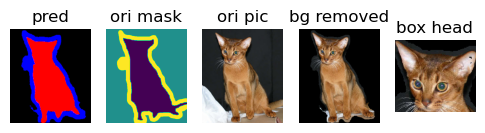

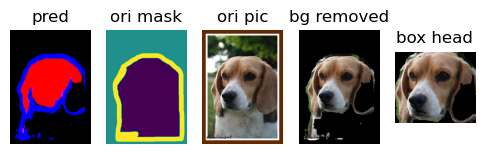

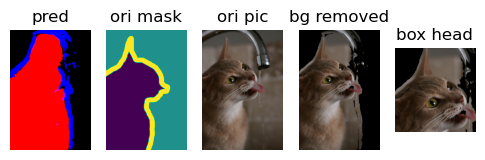

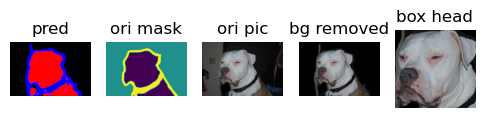

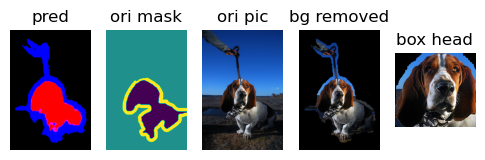

...

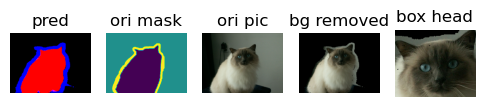

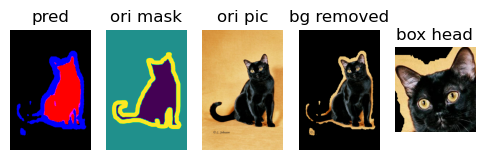

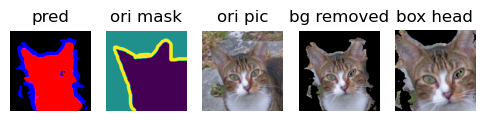

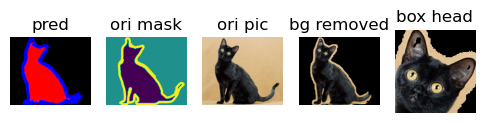

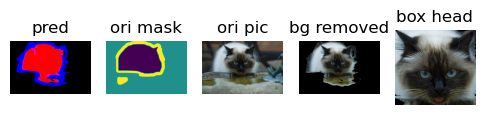

In [22]:
import warnings
import matplotlib
test_list_pt = []
warnings.filterwarnings("ignore", category=matplotlib.MatplotlibDeprecationWarning)
for i in range(len(f_pred_result)):
    image_n = test_df_sia['name'].to_list()[i]
    box_ = [int(i) for i in test_df_sia['box'].to_list()[i]]
    fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(6, 4))

    revert_trans = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((original_size[i][1], original_size[i][2])),
    transforms.ToTensor(),
    ])
    
    reverted_pred = revert_trans(f_pred_result[i].detach().round()).round()
    reverted_pred[1,:,:]=0
    origin_image = io.read_image('data/images/'+image_n+'.jpg')
    removed_bg = origin_image.clone()
    mask_ori = ((reverted_pred[0]==1) | (reverted_pred[2]==1)).type(torch.uint8)
    removed_bg[:,mask_ori==0] = 0
    box_head = removed_bg[:,box_[1]:box_[3],box_[0]:box_[2]]
    test_list_pt.append(box_head)
    axs[0].imshow(reverted_pred.permute(1,2,0))
    axs[0].axis('off')
    axs[0].set_title('pred')
    
    axs[1].imshow(io.read_image('data/trimaps/'+image_n+'.png').permute(1,2,0))
    axs[1].axis('off')
    axs[1].set_title('ori mask')
    
    axs[2].imshow(origin_image.permute(1,2,0))
    axs[2].set_title('ori pic')
    axs[2].axis('off')
    
    axs[3].imshow(removed_bg.permute(1,2,0))
    axs[3].set_title('bg removed')
    axs[3].axis('off')
    axs[4].imshow(box_head.permute(1,2,0))
    axs[4].set_title('box head')
    axs[4].axis('off')

/var/folders/td/1zp1k2xj2m5dwylk8w2lttg80000gn/T/ipykernel_66191/2676438861.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(6, 4))


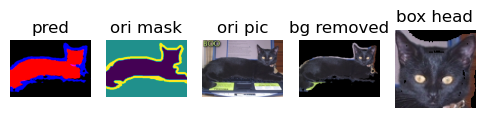

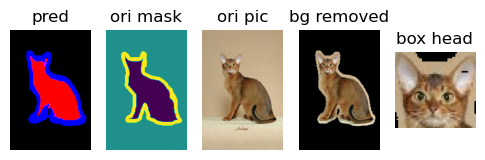

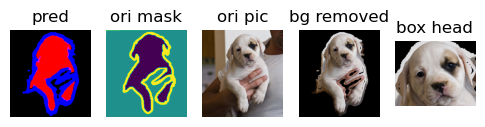

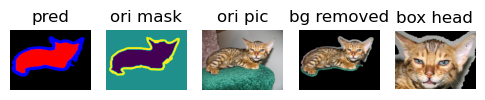

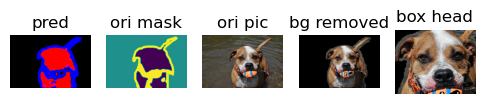

...

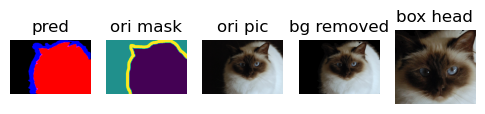

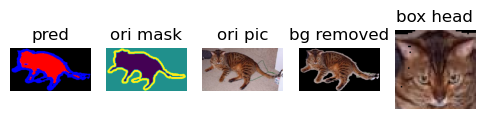

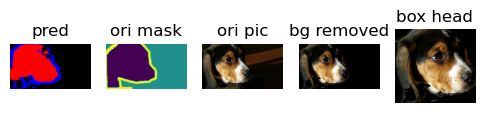

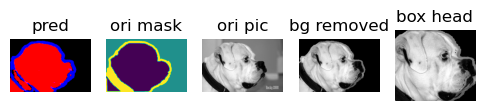

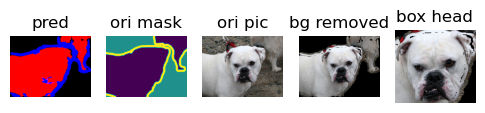

In [23]:

train_list_pt = []
warnings.filterwarnings("ignore", category=matplotlib.MatplotlibDeprecationWarning)
for i in range(len(f_pred_result_train)):
    image_n = train_df_sia['name'].to_list()[i]
    box_ = [int(i) for i in train_df_sia['box'].to_list()[i]]
    fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(6, 4))

    revert_trans = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((original_size_train[i][1], original_size_train[i][2])),
    transforms.ToTensor(),
    ])
    
    reverted_pred = revert_trans(f_pred_result_train[i].detach().round()).round()
    reverted_pred[1,:,:]=0
    origin_image = io.read_image('data/images/'+image_n+'.jpg')
    removed_bg = origin_image.clone()
    mask_ori = ((reverted_pred[0]==1) | (reverted_pred[2]==1)).type(torch.uint8)
    removed_bg[:,mask_ori==0] = 0
    box_head = removed_bg[:,box_[1]:box_[3],box_[0]:box_[2]]
    train_list_pt.append(box_head)
    axs[0].imshow(reverted_pred.permute(1,2,0))
    axs[0].axis('off')
    axs[0].set_title('pred')
    
    axs[1].imshow(io.read_image('data/trimaps/'+image_n+'.png').permute(1,2,0))
    axs[1].axis('off')
    axs[1].set_title('ori mask')
    
    axs[2].imshow(origin_image.permute(1,2,0))
    axs[2].set_title('ori pic')
    axs[2].axis('off')
    
    axs[3].imshow(removed_bg.permute(1,2,0))
    axs[3].set_title('bg removed')
    axs[3].axis('off')
    
    axs[4].imshow(box_head.permute(1,2,0))
    axs[4].set_title('box head')
    axs[4].axis('off')

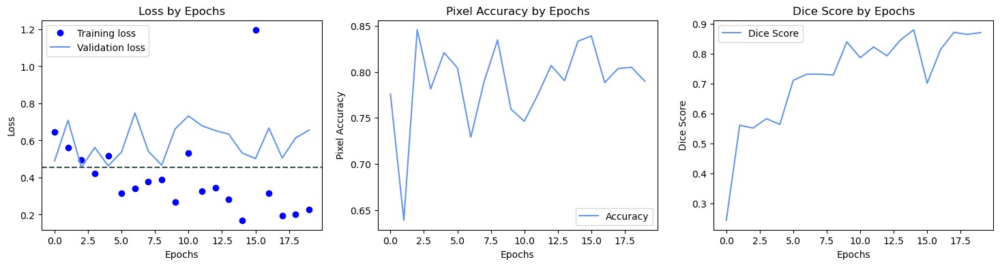

In [24]:
# plot loss by epochs
   # create plots
plt.subplots(figsize=(18,4))
min_loss = np.min(history['end_val_loss'])
plt.subplot(1,3,1)
plt.plot(history['end_loss'], 'bo', label = 'Training loss')
plt.plot(history['end_val_loss'], 'cornflowerblue', label = 'Validation loss')
plt.title('Loss by Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.axhline(y=min_loss,color='darkslategray', linestyle='--')
plt.legend()

# plot accuracy by epochs
plt.subplot(1,3,2)
plt.plot(history['end_val_correct'], 'cornflowerblue', label = 'Accuracy')
plt.title('Pixel Accuracy by Epochs')
plt.xlabel('Epochs')
plt.ylabel('Pixel Accuracy')
plt.legend()

# plot dice score by epochs
plt.subplot(1,3,3)
plt.plot(history['end_dice'], 'cornflowerblue', label = 'Dice Score')
plt.title('Dice Score by Epochs')
plt.xlabel('Epochs')
plt.ylabel('Dice Score')
plt.legend()

In [25]:

class SiameseNetwork(nn.Module):
    def __init__(self):
        super(SiameseNetwork, self).__init__()
        self.cnn1 = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(1, 4, kernel_size=3),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(4),
            nn.Dropout2d(p=.2),
            
            nn.ReflectionPad2d(1),
            nn.Conv2d(4, 8, kernel_size=3),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(8),
            nn.Dropout2d(p=.2),

            nn.ReflectionPad2d(1),
            nn.Conv2d(8, 8, kernel_size=3),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(8),
            nn.Dropout2d(p=.2),
        )

        self.fc1 = nn.Sequential(
            nn.Linear(8*100*100, 500),
            nn.ReLU(inplace=True),

            nn.Linear(500, 500),
            nn.ReLU(inplace=True),

            nn.Linear(500, 5)
        )

    def forward_once(self, x):
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input1, input2):
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        return output1, output2

In [26]:
class ContrastiveLoss(torch.nn.Module):
    """
    Contrastive loss function.
    Based on: http://yann.lecun.com/exdb/publis/pdf/hadsell-chopra-lecun-06.pdf
    """

    def __init__(self, margin=2.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
        euclidean_distance = torch.nn.functional.pairwise_distance(output1, output2)
        loss_contrastive = torch.mean((1-label) * torch.pow(euclidean_distance, 2) +
                                      (label) * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2))


        return loss_contrastive

In [27]:
train_df_sia['sb_id'] = train_df_sia['species'].astype(int)*1000 +train_df_sia['breed_id'].astype(int)
test_df_sia['sb_id'] = test_df_sia['species'].astype(int)*1000 +test_df_sia['breed_id'].astype(int)
 
train_df_sia

,name,class_id,species,breed_id,box,sb_id
0,Bombay_109,8,1,4,"[197, 19, 276, 96]",1004
1,Abyssinian_11,1,1,1,"[43, 57, 94, 105]",1001
2,american_bulldog_194,2,2,1,"[138, 22, 360, 201]",2001
3,Bengal_121,6,1,2,"[251, 53, 450, 196]",1002
4,american_bulldog_105,2,2,1,"[166, 73, 375, 241]",2001
...,...,...,...,...,...,...
191,Birman_181,7,1,3,"[153, 14, 416, 257]",1003
192,Bengal_140,6,1,2,"[31, 10, 87, 65]",1002
193,beagle_146,5,2,4,"[1, 1, 306, 281]",2004
194,american_bulldog_199,2,2,1,"[73, 25, 400, 314]",2001


In [28]:
list_name_img_train = [train_list_pt,train_df_sia['name'].to_list(),train_df_sia['sb_id']]
list_name_img_test = [test_list_pt,test_df_sia['name'].to_list(),test_df_sia['sb_id']]


In [29]:
import random
pt_transform=transforms.Compose([
    transforms.ToPILImage(),
    transforms.Grayscale(),
    transforms.Resize((100,100)),
                              transforms.ToTensor()
                              ])
class SiameseNetworkDataset(Dataset):
    
    def __init__(self,list_all_info,transform=None,should_invert=True):
        self.len_data = len(list_all_info[1])        
        self.list_index = list(range(self.len_data))
        self.img_list = list_all_info[0]
        self.transform = transform
        self.img_name = list_all_info[1]
        self.sb_id = list_all_info[2]
    def __len__(self):
        return len(self.img_name)
    def __getitem__(self,index):
        # index
        # picked_index = random.choice(self.list_index)
        picked_index = index
        img0_tuple = self.img_list[picked_index]
        #we need to make sure approx 50% of images are in the same class
        should_get_same_class = random.randint(0,1) 
        if should_get_same_class:
            list_same_class = [self.img_list[i] for i in range(self.len_data) if 
             (self.sb_id[i] == self.sb_id[picked_index]) 
             &
             (self.img_name[i]!=self.img_name[picked_index])
            ]
            img1_tuple = random.choice(list_same_class) 

        else:
            list_diff_class = [self.img_list[i] for i in range(self.len_data) 
                               if 
             (self.sb_id[i] != self.sb_id[picked_index]) 
             &
             (self.img_name[i]!=self.img_name[picked_index])
            ]
            img1_tuple = random.choice(list_diff_class) 

        img0 = img0_tuple.clone()
        img1 = img1_tuple.clone()
        
        
        # if self.should_invert:
        #     img0 = PIL.ImageOps.invert(img0)
        #     img1 = PIL.ImageOps.invert(img1)

        if self.transform is not None:
            img0 = self.transform(img0)
            img1 = self.transform(img1)
        # print(img0)
        return img0, img1 , torch.tensor([should_get_same_class]).to(torch.float)
    


In [30]:
len(list_name_img_train[1])

196

In [31]:
train_sia_dataset = SiameseNetworkDataset(list_name_img_train,transform=pt_transform,should_invert=False)
test_sia_dataset = SiameseNetworkDataset(list_name_img_test,transform=pt_transform,should_invert=False)

train_sia_dataloader = DataLoader(train_sia_dataset,shuffle=True,batch_size=6)
test_sia_dataloader = DataLoader(test_sia_dataset,shuffle=True,batch_size=1)

In [32]:

net = SiameseNetwork()
criterion = ContrastiveLoss()
optimizer = torch.optim.Adam(net.parameters(),lr = 0.00001 )

counter = []
loss_history = [] 
iteration_number= 0

for epoch in range(0,30):
    loss_every_epoch = 0
    num_iter = 0
    for i, data in enumerate(train_sia_dataloader,0):

        img0, img1 , label = data
        # img0, img1 , label = Variable(img0), Variable(img1) , Variable(label)
        output1,output2 = net(img0,img1)
        optimizer.zero_grad()
        loss_contrastive = criterion(output1,output2,label)
        loss_contrastive.backward()
        optimizer.step()
        num_iter += 1
        loss_every_epoch += loss_contrastive.data.item()
    
        
    print("Epoch {} avg-loss {} ".format(epoch,loss_every_epoch/num_iter))


Epoch 0 avg-loss 1.2356681932102551 
Epoch 1 avg-loss 1.1401844160123304 
Epoch 2 avg-loss 1.1609655474171494 
Epoch 3 avg-loss 1.1509487358006565 
Epoch 4 avg-loss 1.166777435577277 
Epoch 5 avg-loss 1.1064242341301658 
Epoch 6 avg-loss 1.105620315580657 
Epoch 7 avg-loss 1.0978173776106401 
Epoch 8 avg-loss 1.1446167338978162 
Epoch 9 avg-loss 1.1759667721661655 
Epoch 10 avg-loss 1.1737175547715388 
Epoch 11 avg-loss 1.1015584143725308 
Epoch 12 avg-loss 1.1027226773175327 
Epoch 13 avg-loss 1.1366501938213 
Epoch 14 avg-loss 1.125686425151247 
Epoch 15 avg-loss 1.1664980613824092 
Epoch 16 avg-loss 1.1162226380723896 
Epoch 17 avg-loss 1.1333348660758047 
Epoch 18 avg-loss 1.1090858271627715 
Epoch 19 avg-loss 1.0810916712789824 
Epoch 20 avg-loss 1.089239817677122 
Epoch 21 avg-loss 1.1733564246784558 
Epoch 22 avg-loss 1.1318237203540225 
Epoch 23 avg-loss 1.1474846944664463 
Epoch 24 avg-loss 1.150073315158035 
Epoch 25 avg-loss 1.1305649479230244 
Epoch 26 avg-loss 1.1539009285

/var/folders/td/1zp1k2xj2m5dwylk8w2lttg80000gn/T/ipykernel_66191/3253523441.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(6, 2))


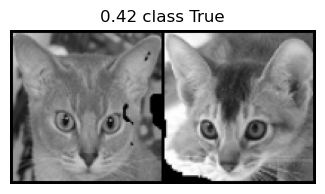

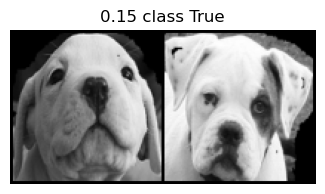

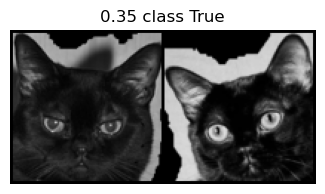

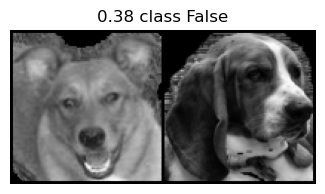

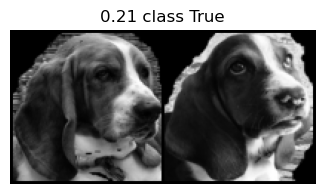

...

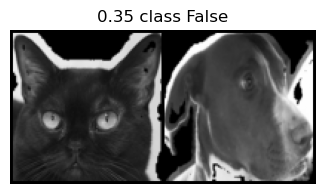

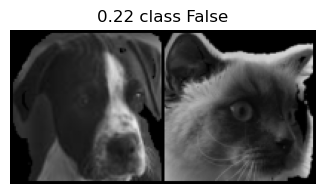

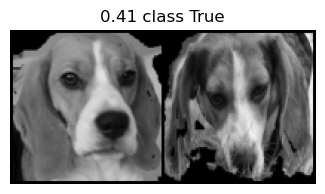

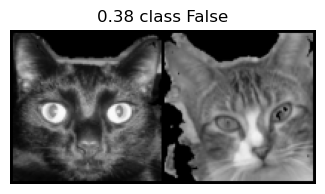

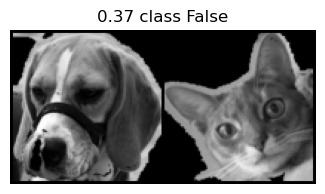

In [33]:


test_dataloader2 = DataLoader(test_sia_dataset,batch_size=1,shuffle=True)
# dataiter = iter(test_dataloader)
# x0,_,_ = next(dataiter)

for i in test_dataloader2:
    concatenated = torch.cat((i[0],i[1]),0)
    
    output1,output2 = net(i[0],i[1])
    euclidean_distance = torch.nn.functional.pairwise_distance(output1, output2)

    fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(6, 2))
    
    axs.imshow(torchvision.utils.make_grid(concatenated).permute(1,2,0))
    axs.axis('off')
    axs.set_title(str(euclidean_distance.data.item())[:4]+f' class {i[2].data.item()==1}')
    

    
    
